In [134]:
import pandas as pd
import matplotlib.pyplot as plt

def plot_columns_by_frequency(
    df, columns, 
    freq='D', 
    ignore_datetimes=False, 
    vertical_lines=None,
    line_text=None
):
    """
    Plot columns from a dataframe based on specified frequency.
    
    df: pandas DataFrame with a datetime index
    columns: list of columns to plot
    freq: frequency for plotting ('D' for day, 'W' for week, 'M' for month, 'Y' for year, or integer if ignore_datetimes=True)
    ignore_datetimes: if True, plots against a dummy index instead of datetimes
    vertical_lines: list of 2-tuple with datetimes indicating positions for vertical lines. 
                    The first datetime is plotted as a red line and the second as a green line.
    """

    if ignore_datetimes:
        if isinstance(freq, int):
            num_points = freq
        else:
            raise ValueError("When ignore_datetimes=True, freq should be an integer representing number of points.")
        
        indices = list(range(0, len(df), num_points))
        if indices[-1] != len(df):
            indices.append(len(df))

        for start, end in zip(indices[:-1], indices[1:]):
            subset = df.iloc[start:end]
            plt.figure(figsize=(10, 6))
            subset[columns].plot(ax=plt.gca(), marker='.', linestyle='--', secondary_y=True)
            
            if vertical_lines:
                for line in vertical_lines:
                    if df.index[start] <= line[0] <= df.index[end-1]:
                        idx_before = df.index.get_loc(line[0], method='ffill')
                        idx_after = df.index.get_loc(line[0], method='bfill')
                        pos = (idx_before + idx_after) / 2 - start
                        plt.axvline(x=pos, color='red')
                    
                    if df.index[start] <= line[1] <= df.index[end-1]:
                        idx_before = df.index.get_loc(line[1], method='ffill')
                        idx_after = df.index.get_loc(line[1], method='bfill')
                        pos = (idx_before + idx_after) / 2 - start
                        plt.axvline(x=pos, color='green')
            
            plt.title(f'Data from {subset.index[0]} to {subset.index[-1]}')
            plt.show()

    else:
        for sub_df in df.resample(freq):
            label, subset = sub_df
            if not subset.empty:
                plt.figure(figsize=(10, 6))
                subset[columns].plot(ax=plt.gca(), marker='.', linestyle='--', secondary_y=True)
                if vertical_lines:
                    for (line_idx, line) in enumerate(vertical_lines):
                        line_plotted=False
                        if subset.index[0] <= line[0] <= subset.index[-1]:
                            plt.axvline(x=line[0], color='red')
                            line_plotted=True
                        if subset.index[0] <= line[1] <= subset.index[-1]:
                            plt.axvline(x=line[1], color='green')
                            line_plotted=True
                        if line_plotted and len(line_text) == len(vertical_lines):
                            print(f'line:{line_idx}, reason:{line_text[line_idx]}')
                            
                plt.title(f'Data from {subset.index[0]} to {subset.index[-1]}')
                plt.show()

In [135]:
from pandas.tseries.frequencies import to_offset

def plot_time_window(df, datetime_of_interest, column_of_interest, time_window):
    """
    Plots data from a specified column and time window centered around a given datetime.

    :param df: Pandas DataFrame with a datetime index.
    :param datetime_of_interest: The central datetime around which the time window is defined.
    :param column_of_interest: The column to be plotted.
    :param time_window: Time window (e.g., '2D' for 2 days, '3H' for 3 hours, etc.)
    """
    # Convert the time window string to a pandas offset
    time_delta = to_offset(time_window)

    # Calculate start and end times
    start_time = datetime_of_interest - time_delta
    end_time = datetime_of_interest + time_delta

    # Filter the DataFrame
    windowed_df = df[(df.index >= start_time) & (df.index <= end_time)]

    # Plotting
    plt.figure(figsize=(10, 6))
    windowed_df[column_of_interest].plot()
    plt.title(f"{column_of_interest} from {start_time} to {end_time}")
    plt.xlabel('Datetime')
    plt.ylabel(column_of_interest)
    plt.grid(True)
    plt.show()

In [136]:
def clean_data(df):
    df = df[(df['Extruder Pressure'] >= 0) & (df['Extruder Pressure'] < 50000)]
    
    return df

In [137]:
def get_machine_pauses(df, time_threshold=10, col='Date and Time'):
    
    #test = pd.to_datetime(df.index)
    #return test.diff()
    #time_diff = -1*(df['Date and Time'].diff(-1).dt.total_seconds()/60)
    if col is None:
        data_times = pd.to_datetime(df.index)
    else:
        data_times = pd.to_datetime(df[col])
    time_diff = -1*(data_times.diff(-1).dt.total_seconds()/60)
    #time_diff = (df['Date and Time'].shift(-1) - df['Date and Time']).dt.total_seconds()/60

    machine_pauses = df[time_diff > time_threshold].index
    
    return machine_pauses

def get_time_to_next_pause(df, machine_pauses):
    

def calculate_time_difference(df):

    time_diff = (df['Date and Time'].shift(-1) - df['Date and Time']).dt.total_seconds()/60
    return time_diff

In [138]:
extruder_data.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 102606 entries, 2022-11-08 08:41:00 to 2023-03-28 17:32:00
Data columns (total 11 columns):
 #   Column                             Non-Null Count   Dtype         
---  ------                             --------------   -----         
 0   Extruder Pressure                  102606 non-null  float64       
 1   Screw Speed Output                 102606 non-null  float64       
 2   Screw Speed                        102606 non-null  float64       
 3   Extruder Die Temp                  102606 non-null  float64       
 4   Extruder Thrust                    102606 non-null  float64       
 5   Feed Screw Current (Amps)          102606 non-null  float64       
 6   Discharge Conveyor Current (Amps)  102606 non-null  float64       
 7   Discharge Conveyor Speed (%)       102606 non-null  float64       
 8   Date and Time                      102606 non-null  datetime64[ns]
 9   time_diff                          102605 non-null  float6

In [139]:
machine_pauses

DatetimeIndex(['2022-11-20 10:31:00', '2022-12-23 18:03:00',
               '2022-12-23 19:29:00', '2022-12-23 19:54:00',
               '2022-12-30 08:52:00', '2022-12-30 09:14:00',
               '2023-01-05 11:32:00', '2023-01-05 14:09:00',
               '2023-02-06 12:00:00', '2023-02-06 12:33:00',
               '2023-02-13 17:14:00', '2023-02-13 18:46:00',
               '2023-02-13 19:07:00', '2023-02-17 14:32:00',
               '2023-02-17 14:54:00', '2023-02-17 15:10:00',
               '2023-02-26 19:14:00', '2023-02-26 19:37:00',
               '2023-02-26 20:26:00', '2023-03-07 11:42:00',
               '2023-03-07 12:05:00', '2023-03-07 12:18:00',
               '2023-03-12 01:59:00', '2023-03-14 00:05:00',
               '2023-03-14 01:59:00', '2023-03-14 02:55:00',
               '2023-03-14 03:16:00', '2023-03-28 16:56:00',
               '2023-03-28 17:12:00'],
              dtype='datetime64[ns]', name='Date and Time', freq=None)

In [140]:
#def filter_on_datetime(df, datecol, datetime, window_in_hours):
#    
#    return(df[df[datecol] >])
#    
machine_pauses

DatetimeIndex(['2022-11-20 10:31:00', '2022-12-23 18:03:00',
               '2022-12-23 19:29:00', '2022-12-23 19:54:00',
               '2022-12-30 08:52:00', '2022-12-30 09:14:00',
               '2023-01-05 11:32:00', '2023-01-05 14:09:00',
               '2023-02-06 12:00:00', '2023-02-06 12:33:00',
               '2023-02-13 17:14:00', '2023-02-13 18:46:00',
               '2023-02-13 19:07:00', '2023-02-17 14:32:00',
               '2023-02-17 14:54:00', '2023-02-17 15:10:00',
               '2023-02-26 19:14:00', '2023-02-26 19:37:00',
               '2023-02-26 20:26:00', '2023-03-07 11:42:00',
               '2023-03-07 12:05:00', '2023-03-07 12:18:00',
               '2023-03-12 01:59:00', '2023-03-14 00:05:00',
               '2023-03-14 01:59:00', '2023-03-14 02:55:00',
               '2023-03-14 03:16:00', '2023-03-28 16:56:00',
               '2023-03-28 17:12:00'],
              dtype='datetime64[ns]', name='Date and Time', freq=None)

In [141]:
#extruder_data.info()

In [142]:
import pandas as pd
import re

#columns_oi = ['Extruder Pressure', 'Extruder Thrust', 'Extruder Die Temp']

# Read the CSV file into a DataFrame
extruder_data = pd.read_csv("ex3-data.csv",)

print(f'raw_shape: {extruder_data.shape}')

extruder_data = extruder_data.drop(extruder_data.index[0])

columns_oi = ['Extruder Pressure']
extruder_data = extruder_data.dropna(subset=columns_oi)

# Define the pattern
pattern = r'<null>'

# Filter rows where any column matches the pattern
matching_rows = extruder_data.applymap(
    lambda x: bool(re.search(pattern, str(x)))
).any(axis=1)

filtered_df = extruder_data[matching_rows]

print(filtered_df.shape[0])
filtered_df.head(5)

/tmp/ipykernel_9529/2625544181.py:8: DtypeWarning: Columns (2,3,4,5,6,7,8) have mixed types. Specify dtype option on import or set low_memory=False.
  extruder_data = pd.read_csv("ex3-data.csv",)
/tmp/ipykernel_9529/2625544181.py:23: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  matching_rows = extruder_data.applymap(


raw_shape: (255334, 9)
54


,Date and Time,Extruder Pressure,Screw Speed Output,Screw Speed,Extruder Die Temp,Extruder Thrust,Feed Screw Current (Amps),Discharge Conveyor Current (Amps),Discharge Conveyor Speed (%)
217401,2/26/2023 2:52 PM,<null>,<null>,<null>,<null>,99.35,5.36,0,50
217402,2/26/2023 2:52 PM,<null>,<null>,<null>,<null>,<null>,<null>,<null>,50
217403,2/26/2023 2:52 PM,<null>,<null>,<null>,<null>,<null>,<null>,<null>,<null>
217404,2/26/2023 2:53 PM,<null>,<null>,<null>,398,<null>,<null>,<null>,<null>
217405,2/26/2023 2:53 PM,<null>,<null>,<null>,398,34.72,0,0,<null>


In [143]:
extruder_data = extruder_data.replace("<null>", None)

In [144]:
extruder_data.head()

,Date and Time,Extruder Pressure,Screw Speed Output,Screw Speed,Extruder Die Temp,Extruder Thrust,Feed Screw Current (Amps),Discharge Conveyor Current (Amps),Discharge Conveyor Speed (%)
1,11/8/2022 8:41 AM,"3,819.45",27.04,19.64,12.16,53.42,4.79,0.94,75.4
2,11/8/2022 8:41 AM,"3,819.45",27.04,19.64,12.16,53.42,4.79,0.94,75.4
3,11/8/2022 8:41 AM,"3,819.45",27.04,19.64,12.16,53.42,4.79,0.91,75.4
4,11/8/2022 8:41 AM,"3,965.45",27.04,19.64,12.16,53.42,4.79,0.91,75.4
5,11/8/2022 8:42 AM,"3,965.45",27.04,19.64,12.16,54.28,4.79,0.91,75.4


In [145]:
# Convert the column to string type
for column in extruder_data.columns:
    if column not in ["Date and Time", "AnomalyScore"]:
        extruder_data[column] = extruder_data[column].astype(str)
        #extruder_data[column] = extruder_data[column].str.replace("<null>", None)
        # Replace commas with an empty string
        extruder_data[column] = extruder_data[column].str.replace(",", "")

        # Convert the column back to numeric type, handling any conversion errors
        extruder_data[column] = pd.to_numeric(extruder_data[column], errors="coerce")
        
extruder_data['Date and Time'] = pd.to_datetime(extruder_data['Date and Time'])

extruder_data = clean_data(extruder_data)
extruder_data = extruder_data.groupby('Date and Time').mean()


extruder_data['Date and Time'] = extruder_data.index.values
machine_pauses = get_machine_pauses(extruder_data, time_threshold=10)

# extruder_data = pd.read_csv("ex4-data.csv",)

#extruder_data = extruder_data.fillna(value=0)


# # Remove the comma from the string
        


In [99]:
extruder_data.head()

,Extruder Pressure,Screw Speed Output,Screw Speed,Extruder Die Temp,Extruder Thrust,Feed Screw Current (Amps),Discharge Conveyor Current (Amps),Discharge Conveyor Speed (%),Date and Time
Date and Time,,,,,,,,,
2022-11-08 08:41:00,3855.95,27.04,19.64,12.16,53.42,4.79,0.925,75.4,2022-11-08 08:41:00
2022-11-08 08:42:00,3965.45,27.04,19.64,12.16,54.28,4.79,0.910,75.4,2022-11-08 08:42:00
2022-11-08 08:45:00,3965.45,27.04,19.64,12.16,54.28,0.00,0.910,75.4,2022-11-08 08:45:00
2022-11-08 08:47:00,3564.65,27.04,19.64,12.16,54.28,0.00,0.910,75.4,2022-11-08 08:47:00
2022-11-08 08:48:00,3564.65,27.04,19.64,12.16,54.28,5.01,0.910,75.4,2022-11-08 08:48:00


In [117]:
extruder_data.head()

,Extruder Pressure,Screw Speed Output,Screw Speed,Extruder Die Temp,Extruder Thrust,Feed Screw Current (Amps),Discharge Conveyor Current (Amps),Discharge Conveyor Speed (%),Date and Time
Date and Time,,,,,,,,,
2022-11-08 08:41:00,3855.95,27.04,19.64,12.16,53.42,4.79,0.925,75.4,2022-11-08 08:41:00
2022-11-08 08:42:00,3965.45,27.04,19.64,12.16,54.28,4.79,0.910,75.4,2022-11-08 08:42:00
2022-11-08 08:45:00,3965.45,27.04,19.64,12.16,54.28,0.00,0.910,75.4,2022-11-08 08:45:00
2022-11-08 08:47:00,3564.65,27.04,19.64,12.16,54.28,0.00,0.910,75.4,2022-11-08 08:47:00
2022-11-08 08:48:00,3564.65,27.04,19.64,12.16,54.28,5.01,0.910,75.4,2022-11-08 08:48:00


In [100]:
extruder_data['Date and Time'] = extruder_data.index.values

machine_pauses = get_machine_pauses(extruder_data)
len(machine_pauses)

In [128]:
time_diff = calculate_time_difference(extruder_data)

extruder_data['time_diff'] = calculate_time_difference(extruder_data)
extruder_data['time_diff_2'] = -1*(extruder_data['Date and Time'].diff(-1).dt.total_seconds()/60)

In [129]:
extruder_data[['Date and Time', 'time_diff', 'time_diff_2']].head(50)

,Date and Time,time_diff,time_diff_2
Date and Time,,,
2022-11-08 08:41:00,2022-11-08 08:41:00,1.0,1.0
2022-11-08 08:42:00,2022-11-08 08:42:00,3.0,3.0
2022-11-08 08:45:00,2022-11-08 08:45:00,2.0,2.0
2022-11-08 08:47:00,2022-11-08 08:47:00,1.0,1.0
2022-11-08 08:48:00,2022-11-08 08:48:00,1.0,1.0
2022-11-08 08:49:00,2022-11-08 08:49:00,1.0,1.0
2022-11-08 08:50:00,2022-11-08 08:50:00,1.0,1.0
2022-11-08 08:51:00,2022-11-08 08:51:00,2.0,2.0
2022-11-08 08:53:00,2022-11-08 08:53:00,2.0,2.0


In [131]:
test_df = extruder_data[extruder_data['time_diff'] > 10]
len(test_df)

29

In [122]:
time_diff.value_counts()

Date and Time
1.0        70761
2.0        22616
3.0         6683
4.0         1900
5.0          507
6.0           92
7.0           10
9.0            5
8.0            2
15.0           2
13.0           2
37.0           2
21.0           2
12435.0        1
22.0           1
77.0           1
12.0           1
63.0           1
14.0           1
38.0           1
8842.0         1
543.0          1
33.0           1
18.0           1
5479.0         1
89.0           1
35.0           1
8930.0         1
153.0          1
8774.0         1
9396.0         1
80.0           1
47.0           1
19.0           1
Name: count, dtype: int64

<Axes: >

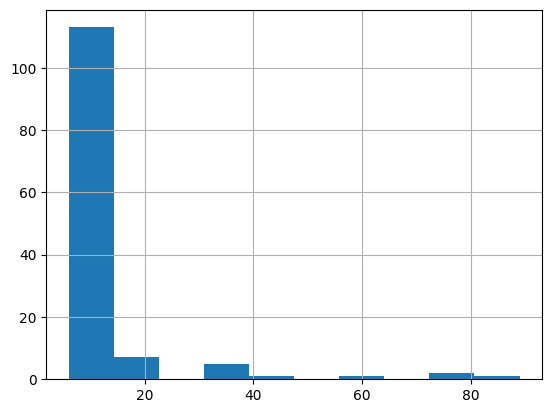

In [124]:
time_diff[(time_diff < 120) & (time_diff > 5)].hist()

In [102]:
date_oi = pd.to_datetime('1/21/23').date()
test = extruder_data[extruder_data.index.date == date_oi]
#print(date_oi)
#test.iloc[275:325]

In [103]:
len(test)

932

In [132]:
len(machine_pauses)

29

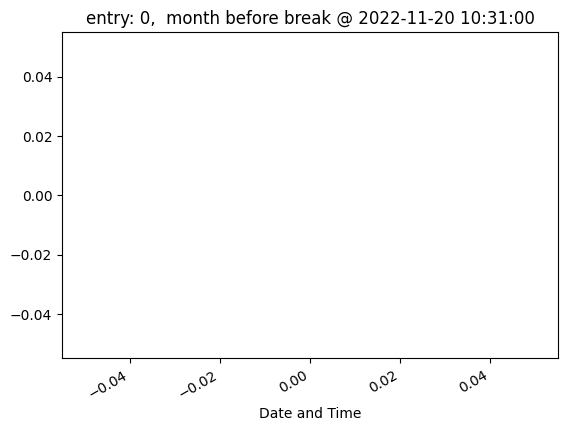

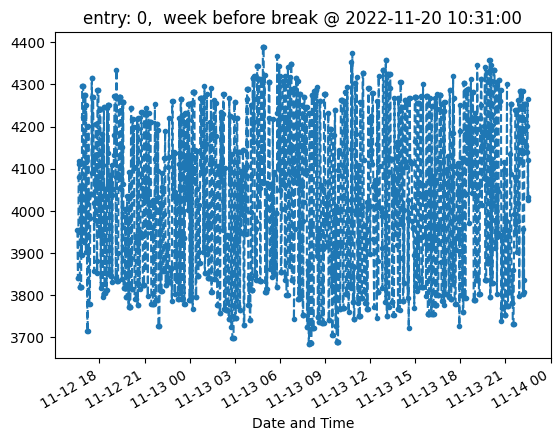

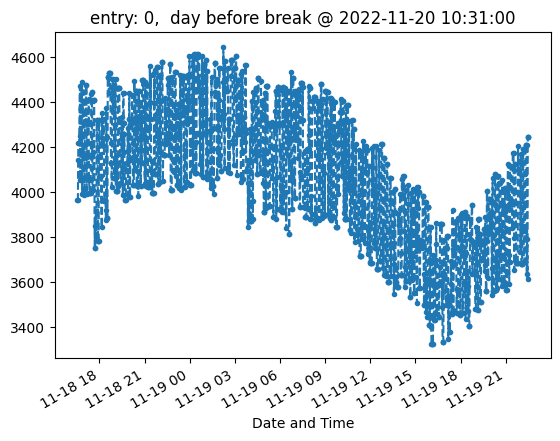

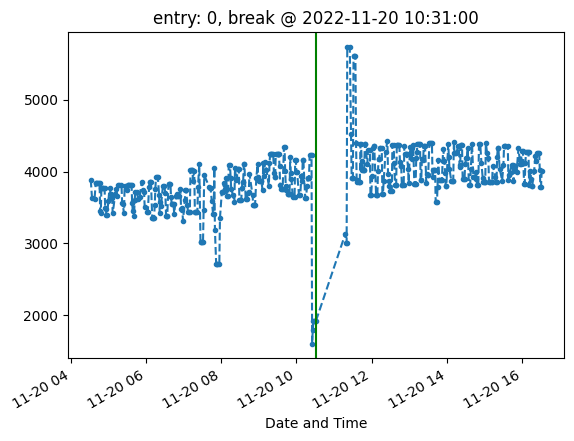

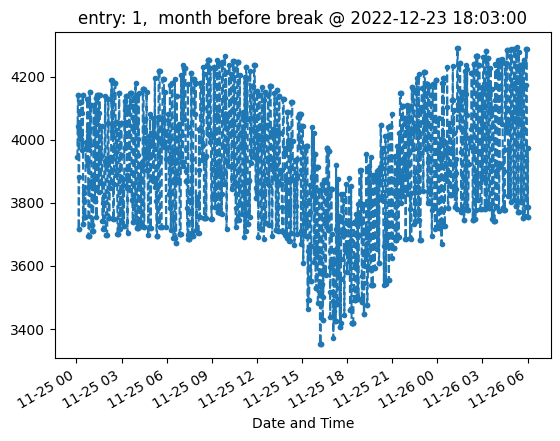

...

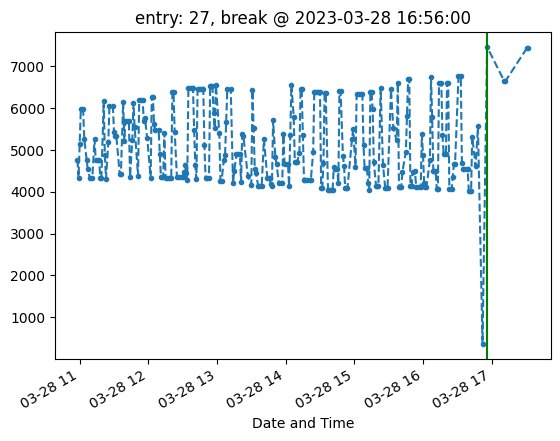

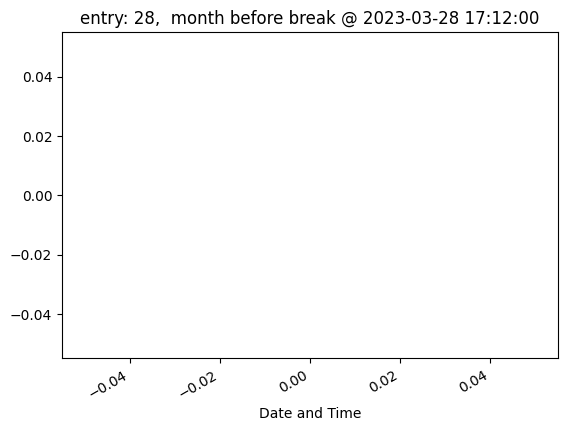

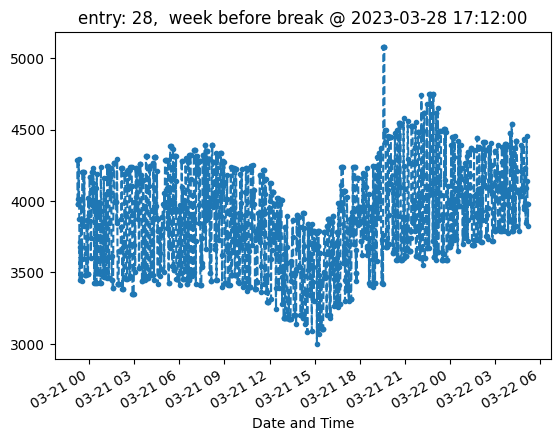

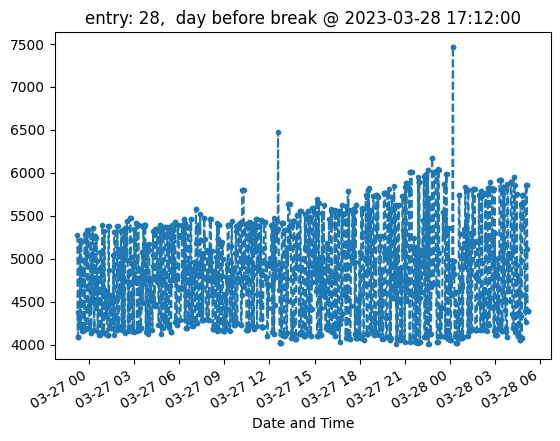

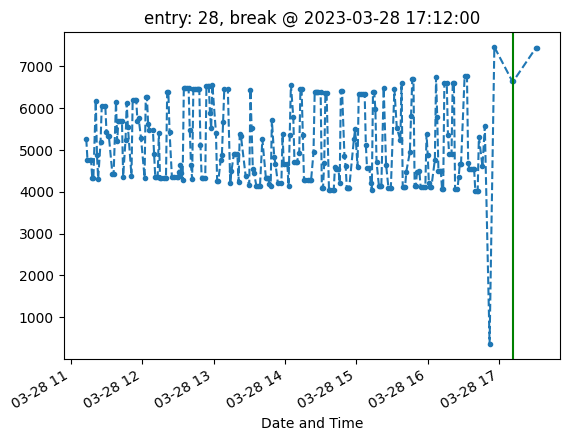

In [148]:
for (i, pause_time) in enumerate(machine_pauses):
    
    early_cutoff = pause_time - pd.Timedelta(hours=18) - pd.Timedelta(weeks=4)
    late_cutoff = pause_time + pd.Timedelta(hours=12) - pd.Timedelta(weeks=4)
    mask = (extruder_data.index > early_cutoff) & \
               (extruder_data.index <= late_cutoff)
    
    #print(early_cutoff, late_cutoff)
    
    time_filtered_data = extruder_data[mask]['Extruder Pressure']
    #if time_filtered_data.shape[0] < 100:
    #    continue
    #print(time_filtered_data.shape)
    
    time_filtered_data.plot(marker='.', linestyle='--')
    #plt.axvline(x=pause_time, color='green')
    plt.title(f'entry: {i},  month before break @ {pause_time}')
    plt.show()
    
    early_cutoff = pause_time - pd.Timedelta(hours=18) - pd.Timedelta(weeks=1)
    late_cutoff = pause_time + pd.Timedelta(hours=12) - pd.Timedelta(weeks=1)
    mask = (extruder_data.index > early_cutoff) & \
               (extruder_data.index <= late_cutoff)
    
    #print(early_cutoff, late_cutoff)
    
    time_filtered_data = extruder_data[mask]['Extruder Pressure']
    #if time_filtered_data.shape[0] < 100:
    #    continue
    #print(time_filtered_data.shape)
    
    time_filtered_data.plot(marker='.', linestyle='--')
    #plt.axvline(x=pause_time, color='green')
    plt.title(f'entry: {i},  week before break @ {pause_time}')
    plt.show()
    
    early_cutoff = pause_time - pd.Timedelta(hours=18) - pd.Timedelta(days=1)
    late_cutoff = pause_time + pd.Timedelta(hours=12) - pd.Timedelta(days=1)
    mask = (extruder_data.index > early_cutoff) & \
               (extruder_data.index <= late_cutoff)
    
    #print(early_cutoff, late_cutoff)
    
    time_filtered_data = extruder_data[mask]['Extruder Pressure']
    #if time_filtered_data.shape[0] < 100:
    #    continue
    #print(time_filtered_data.shape)
    
    time_filtered_data.plot(marker='.', linestyle='--')
    #plt.axvline(x=pause_time, color='green')
    plt.title(f'entry: {i},  day before break @ {pause_time}')
    plt.show()
    
    early_cutoff = pause_time - pd.Timedelta(hours=6)
    late_cutoff = pause_time + pd.Timedelta(hours=6)
    mask = (extruder_data.index > early_cutoff) & \
               (extruder_data.index <= late_cutoff)
    
    #print(early_cutoff, late_cutoff)
    
    time_filtered_data = extruder_data[mask]['Extruder Pressure']
    #if time_filtered_data.shape[0] < 100:
    #    continue
    #print(time_filtered_data.shape)
    
    time_filtered_data.plot(marker='.', linestyle='--')
    plt.axvline(x=pause_time, color='green')
    plt.title(f'entry: {i}, break @ {pause_time}')
    plt.show()
    print()
    print()
    #break

In [105]:
machine_pauses

DatetimeIndex(['2022-11-20 10:31:00', '2022-12-23 18:03:00',
               '2022-12-23 19:29:00', '2022-12-23 19:54:00',
               '2022-12-30 08:52:00', '2022-12-30 09:14:00',
               '2023-01-05 11:32:00', '2023-01-05 14:09:00',
               '2023-02-06 12:00:00', '2023-02-06 12:33:00',
               '2023-02-13 17:14:00', '2023-02-13 18:46:00',
               '2023-02-13 19:07:00', '2023-02-17 14:32:00',
               '2023-02-17 14:54:00', '2023-02-17 15:10:00',
               '2023-02-26 19:14:00', '2023-02-26 19:37:00',
               '2023-02-26 20:26:00', '2023-03-07 11:42:00',
               '2023-03-07 12:05:00', '2023-03-07 12:18:00',
               '2023-03-12 01:59:00', '2023-03-14 00:05:00',
               '2023-03-14 01:59:00', '2023-03-14 02:55:00',
               '2023-03-14 03:16:00', '2023-03-28 16:56:00',
               '2023-03-28 17:12:00'],
              dtype='datetime64[ns]', name='Date and Time', freq=None)

In [ ]:
days = extruder_data.index.normalize().unique().tolist()

In [ ]:
for (i, day) in enumerate(days):
    
    early_cutoff = day + pd.Timedelta(hours=6)
    late_cutoff = day + pd.Timedelta(hours=20)
    mask = (extruder_data.index > early_cutoff) & \
               (extruder_data.index <= late_cutoff)
    
    pauses = 
    
    #print(early_cutoff, late_cutoff)
    
    time_filtered_data = extruder_data[mask]['Extruder Pressure']
    if time_filtered_data.shape[0] < 100:
        continue
    #print(time_filtered_data.shape)
    
    time_filtered_data.plot(marker='.', linestyle='--')
    #plt.axvline(x=pause_time, color='green')
    plt.title(f'entry: {i}, data @ {pause_time}')
    plt.show()
    #break

In [ ]:
len(machine_pauses)

In [ ]:
extruder_data['minutes_pause'] = 

In [ ]:
extruder_data.tail(5)

In [ ]:
extruder_data['Date and Time'].min(), extruder_data['Date and Time'].max()

In [ ]:
extruder_data.info()

In [ ]:
plot_weekly_data(extruder_data, 'Date and Time', 'Extruder Pressure')

In [ ]:
extruder_data['Extruder Pressure'].mean()

In [ ]:
import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
import pandas as pd
import numpy as np

inp_data = cleaned_data.drop('Date and Time', axis=1)
target = 'Extruder Pressure'
# Define the features and target variable
X = inp_data.drop(target, axis=1)  # Features (all columns except 'Target')
y = inp_data[target]               # Target variable

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize XGBoost regressor
xg_reg = xgb.XGBRegressor(objective ='reg:squarederror', n_estimators = 10, seed = 123)

# Fit the model to the training set
xg_reg.fit(X_train, y_train)

# Predict the target on the test set
y_pred = xg_reg.predict(X_test)

# Calculate the mean squared error
mse = mean_squared_error(y_test, y_pred)
print(f"Mean Squared Error: {mse}")

In [ ]:
extruder_data['time_diff'] = extruder_data['Date and Time'].diff()

In [ ]:
extruder_data.head()

# pressure elevated and then dropped, 

In [ ]:
#extruder_data['time_diff'].hist()
extruder_data['time_diff_minutes'] = extruder_data['time_diff'].dt.total_seconds()/60
extruder_data['time_diff_minutes'].max()

In [ ]:
mask = (extruder_data['time_diff_minutes'] > 10) & (extruder_data['time_diff_minutes'] < 500)
extruder_data[mask]['time_diff_minutes'].plot(kind='hist', bins=12)

In [ ]:
!pip install xgboost

In [ ]:
pd.set_option('display.max_columns', None)
#df

In [ ]:
test = new_df[new_df[extruder].notnull()]

In [ ]:
test.head(50)

In [ ]:
new_df.head(50)

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Plot the graph
plt.plot(new_df['datetime'], new_df[extruder])
plt.xlabel('Datetime')
plt.ylabel('Hours')
plt.title('Hours worked vs. Datetime')
plt.xticks(rotation=45)  # Rotate x-axis labels for better visibility
plt.show()

In [ ]:
extruder_data.head().T

In [ ]:
extruder_data.head(50)

In [ ]:
#extruder_data[extruder_data['Extruder Pressure'] < 1]['Extruder Pressure'].plot()
#extruder_data['Extruder Pressure'].plot()
extruder_data[extruder_data['Extruder Pressure'] < 1e5]['Extruder Pressure'].plot()
plt.plot()

In [ ]:
extruder_data['outlier'] = (extruder_data['Extruder Pressure'] > 5100)

In [ ]:
extruder_data.head()

In [ ]:
extruder_data[extruder_data['Extruder Pressure'] < 1]['Extruder Pressure'].plot()

In [ ]:
import matplotlib.pyplot as plt

output_channel = 'Extruder Pressure'

input_channels = ['Screw Speed Output', 
                  'Screw Speed', 
                  'Extruder Die Temp',
                 'Extruder Thrust',
                 'Feed Screw Current (Amps)',
                 'Discharge Conveyor Current (Amps)',
                 'Discharge Conveyor Speed (%)']

for inpt in input_channels:
    
    dependent = extruder_data[extruder_data['Extruder Pressure'] < 1e5]['Extruder Pressure']
    independent = extruder_data[extruder_data['Extruder Pressure'] < 1e5][inpt]
    
    plt.scatter(independent, dependent)
    plt.title(f'{inpt} vs Extruder Pressure')
    plt.show()

In [ ]:
extruder_data[extruder_data['Extruder Pressure'] < 1e5]['Extruder Pressure'].hist()

In [ ]:
# Example DataFrame with two normally distributed columns


for inpt in input_channels:
    
    dependent = extruder_data[extruder_data['Extruder Pressure'] < 1e5]['Extruder Pressure']
    independent = extruder_data[extruder_data['Extruder Pressure'] < 1e5][inpt]

    # Plotting the 2D histogram for the DataFrame columns
    plt.hist2d(independent, dependent, bins=30)
    plt.colorbar()  # To show the color scale
    plt.title(f'2D Histogram of {inpt} and Extruder Pressure')
    plt.xlabel(inpt)
    plt.ylabel('Extruder Pressure')
    plt.show()

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

def calculate_correlations(data, target_column, 
                           ascending=False, 
                           include_categorical=True
):
    # Calculate correlations for numerical columns with the target variable
    if include_categorical:
        data_encoded = handle_categorical_columns(data)
        included_features = data_encoded.columns.tolist()
    else:
        data_encoded = data
        included_features = data.select_dtypes(exclude=['object']).columns.tolist()
        
    numerical_correlations = data_encoded[included_features].corr()[target_column].abs()
    
    return numerical_correlations.sort_values(ascending=ascending)

def handle_categorical_columns(data):
    # Separate categorical and numerical columns
    categorical_cols = data.select_dtypes(include=['object']).columns.tolist()
    
    if not categorical_cols:
        return data
    
    # Handle categorical columns (one-hot encoding)
    data_encoded = pd.get_dummies(data, columns=categorical_cols, drop_first=True)
    return data_encoded

def plot_correlation_bar(correlations, 
                         top_n=10, 
                         show_values=False
):
    # Create a bar plot
    fig, ax = plt.subplots(figsize=(10, 6))
    bars = correlations[:top_n].plot(kind='bar', color='skyblue', ax=ax)
    plt.title(f'Top {top_n} Correlated Features')
    plt.xlabel('Feature')
    plt.ylabel('Correlation')
    plt.xticks(rotation=90)
    plt.tight_layout()
    
    # Optionally add correlation values above each bar
    if show_values:
        for bar in bars.patches:
            ax.annotate(
                f'{bar.get_height():.2f}', (bar.get_x() + bar.get_width() / 2, bar.get_height()),
                ha='center', va='bottom'
            )
    
    plt.show()

def select_top_correlated_features(data, target_column, 
                                   top_n=10, 
                                   show_values=False,
                                   ascending=False):

    correlations = calculate_correlations(data, target_column)
    # Plot the top correlated features with optional values
    plot_correlation_bar(correlations, top_n, show_values)
    
    # Return both the correlations and the top N correlated feature names
    top_feature_names = correlations.index.tolist()[:top_n]
    return correlations, top_feature_names

# Example usage:
# Assuming you have a DataFrame 'df' with mixed data types and the target variable is '


In [ ]:
cleaned_data = extruder_data[extruder_data['Extruder Pressure'].notnull()]

cleaned_data = cleaned_data[cleaned_data['Extruder Pressure'] < 1e5]
cleaned_data = cleaned_data[cleaned_data['Extruder Thrust'] < 70]
cleaned_data = cleaned_data[cleaned_data['Extruder Thrust'] > 25]

In [ ]:
extruder_data['Date and Time'].min(), extruder_data['Date and Time'].max()

In [ ]:
cleaned_data.shape

In [ ]:
cleaned_data.head()

In [ ]:
correlations, selected_features = select_top_correlated_features(
    cleaned_data[:10000].drop('Date and Time', axis=1), 'Extruder Pressure', top_n=20, show_values=True)

In [ ]:
plt.scatter(cleaned_data[:1000]['Extruder Thrust'], cleaned_data[:1000]['Extruder Pressure'])

In [ ]:
cleaned_data['Extruder Thrust'].hist()

In [ ]:
correlations, selected_features = select_top_correlated_features(
    cleaned_data[10000:20000], 'Extruder Pressure', top_n=20, show_values=True)

In [ ]:
def plot_weekly_data(df, datetime_col, numeric_col):
    """
    Plots a separate line plot for each week of data in the DataFrame.

    Parameters:
    df (pandas.DataFrame): The DataFrame containing the data.
    datetime_col (str): The name of the column with datetime objects.
    numeric_col (str): The name of the numeric column to plot.
    """
    # Convert the datetime column to pandas datetime type if it's not already
    df[datetime_col] = pd.to_datetime(df[datetime_col])

    # Set the datetime column as the index of the DataFrame
    df.set_index(datetime_col, inplace=True)

    # Resample the data by week and plot each week
    for week, weekly_data in df[numeric_col].resample('W'):
        plt.figure(figsize=(10, 4))
        plt.plot(weekly_data.index, weekly_data.values)
        plt.title(f"Week of {week.strftime('%Y-%m-%d')}")
        plt.xlabel('Date')
        plt.ylabel(numeric_col)
        plt.show()

In [ ]:
extruder_data["Screw Speed"]

In [ ]:
def plot_weekly_data(df, datetime_col, numeric_col):
    """
    Plots a separate line plot for each week of data in the DataFrame.

    Parameters:
    df (pandas.DataFrame): The DataFrame containing the data.
    datetime_col (str): The name of the column with datetime objects.
    numeric_col (str): The name of the numeric column to plot.
    """
    # Convert the datetime column to pandas datetime type if it's not already
    df[datetime_col] = pd.to_datetime(df[datetime_col])

    # Set the datetime column as the index of the DataFrame
    df.set_index(datetime_col, inplace=True)

    # Resample the data by week and plot each week
    for week, weekly_data in df[numeric_col].resample('W'):
        plt.figure(figsize=(10, 4))
        plt.plot(weekly_data.index, weekly_data.values)
        plt.title(f"Week of {week.strftime('%Y-%m-%d')}")
        plt.xlabel('Date')
        plt.ylabel(numeric_col)
        plt.show()

In [ ]:
import pandas as pd
from sklearn.neighbors import LocalOutlierFactor
import numpy as np

def detect_outliers_larger_than(df, column_name, n_neighbors=3, contamination=0.1, threshold=None):

    column_data = df[column_name]
    # Reshape the data to have a single feature
    column_data_reshaped = column_data.values.reshape(-1, 1)

    lof = LocalOutlierFactor(n_neighbors=n_neighbors, contamination=contamination)

    # Fit the model to the column data
    lof.fit(column_data_reshaped)

    # Predict the anomaly scores
    anomaly_scores = lof.negative_outlier_factor_

    # Add the anomaly scores to the DataFrame
    df['AnomalyScore'] = anomaly_scores
    
    threshold = np.abs(df['AnomalyScore']).quantile(threshold)

    # Select the top 5% values using boolean indexing
    top_5_percent = df[np.abs(df['AnomalyScore']) > threshold]

    return top_5_percent

In [ ]:
import pandas as pd
from sklearn.neighbors import LocalOutlierFactor

def detect_outliers(df, column_name, n_neighbors=3, contamination=0.1, threshold_lower=None, threshold_upper=None):

    column_data = df[column_name]

    # Reshape the data to have a single feature
    column_data_reshaped = column_data.values.reshape(-1, 1)

    lof = LocalOutlierFactor(n_neighbors=n_neighbors, contamination=contamination)

    # Fit the model to the column data
    lof.fit(column_data_reshaped)

    # Predict the anomaly scores
    anomaly_scores = lof.negative_outlier_factor_

    # Add the anomaly scores to the DataFrame
    df['AnomalyScore'] = anomaly_scores

    # Identify the anomalies based on the condition
    if threshold_lower is not None and threshold_upper is not None:
        threshold_lower_value = np.abs(df['AnomalyScore']).quantile(threshold_lower)
        threshold_upper_value = np.abs(df['AnomalyScore']).quantile(threshold_upper)
        
        print(threshold_lower_value, threshold_upper_value)
        anomalies = df[(df['AnomalyScore'].abs() > threshold_lower_value) & (df['AnomalyScore'].abs() < threshold_upper_value)]
    else:
        anomalies = df

    return anomalies

In [ ]:
def plot_line_graph_with_collapsed_points(new_df, points_df, original, column_name, title):
    # Convert 'date' column to datetime type in new_df
    new_df['date'] = pd.to_datetime(new_df['datetime'], errors='coerce')

    # Convert 'datetime' column to datetime type in points_df
    points_df['datetime'] = pd.to_datetime(points_df['Date and Time'], errors='coerce').dt.date

    # Group points_df by 'datetime' and aggregate 'column_name' using mean
    points_df_collapsed = points_df.groupby('datetime')[column_name].mean().reset_index()

    # Plot the line graph with dates data
    fig, ax1 = plt.subplots(figsize=(20,12))
    
    # Plot the line graph on the left y-axis
    ax1.plot(new_df['date'], new_df[extruder], label='Hours Worked')
    ax1.set_xlabel('Date')
    ax1.set_ylabel('Hours Worked')

    # Create a second y-axis for 'Extruder Pressure' values
    ax2 = ax1.twinx()

    # Plot the 'Extruder Pressure' values on the right y-axis
    ax2.scatter(points_df_collapsed['datetime'], points_df_collapsed[column_name], color='red',
                label=f'Mean Daily {column_name}')

    # Add a plate to label the mean extruder pressure
    # for i, row in points_df_collapsed.iterrows():
    #     ax2.annotate(round(row[column_name], 2), (row['datetime'], row[column_name]),
    #                  xytext=(5, 0), textcoords='offset points', ha='left', va='bottom')
    mean_value = original[column_name].mean()
    ax2.annotate(f'{column_name} Mean: {str(round(mean_value, 2))}', (new_df['datetime'].iloc[0],
                                                                  mean_value),
                 xytext=(-200, -100), textcoords='offset points', ha='left', va='bottom', color='darkorange')
    ax2.set_ylabel(column_name)

    # Rotate x-axis labels for better visibility
    plt.xticks(rotation=45)

    # Show legend
    ax1.legend(loc='upper left')
    ax2.legend(loc='lower left')

    # Title for the plot
    plt.title(f"{title}")

    plt.show()

In [ ]:
column_name = "Extruder Pressure"
larger_than_anomalies = detect_outliers_larger_than(extruder_data, column_name, n_neighbors=3, contamination=0.1,
                            threshold=0.995)

anomalies = detect_outliers(extruder_data, column_name, n_neighbors=3, contamination=0.1,
                            threshold_lower=.95, threshold_upper=.99)
plot_line_graph_with_collapsed_points(new_df, larger_than_anomalies, extruder_data, column_name, f"Upper Range {column_name} Anomalies")
plot_line_graph_with_collapsed_points(new_df, anomalies, extruder_data, column_name, f"Upper Range {column_name} Anomalies")

In [ ]:
column_name = "Screw Speed Output"
larger_than_anomalies = detect_outliers_larger_than(extruder_data, column_name, n_neighbors=3, contamination=0.1,
                            threshold=0.99)

anomalies = detect_outliers(extruder_data, column_name, n_neighbors=3, contamination=0.1,
                            threshold_lower=.95, threshold_upper=.99)
plot_line_graph_with_collapsed_points(new_df, larger_than_anomalies, extruder_data, column_name, f"Upper Range {column_name} Anomalies")
plot_line_graph_with_collapsed_points(new_df, anomalies, extruder_data, column_name, f"Upper Range {column_name} Anomalies")

In [ ]:
column_name = "Screw Speed"
larger_than_anomalies = detect_outliers_larger_than(extruder_data, column_name, n_neighbors=3, contamination=0.1,
                            threshold=0.99)

anomalies = detect_outliers(extruder_data, column_name, n_neighbors=3, contamination=0.1,
                            threshold_lower=.95, threshold_upper=.99)
plot_line_graph_with_collapsed_points(new_df, larger_than_anomalies, extruder_data, column_name, f"Upper Range {column_name} Anomalies")
plot_line_graph_with_collapsed_points(new_df, anomalies, extruder_data, column_name, f"Upper Range {column_name} Anomalies")

In [ ]:
column_name = "Extruder Die Temp"
larger_than_anomalies = detect_outliers_larger_than(extruder_data, column_name, n_neighbors=3, contamination=0.1,
                            threshold=0.99)

anomalies = detect_outliers(extruder_data, column_name, n_neighbors=3, contamination=0.1,
                            threshold_lower=.95, threshold_upper=.99)
plot_line_graph_with_collapsed_points(new_df, larger_than_anomalies, extruder_data, column_name, f"Upper Range {column_name} Anomalies")
plot_line_graph_with_collapsed_points(new_df, anomalies, extruder_data, column_name, f"Upper Range {column_name} Anomalies")

In [ ]:
column_name = "Extruder Thrust"
larger_than_anomalies = detect_outliers_larger_than(extruder_data, column_name, n_neighbors=3, contamination=0.1,
                            threshold=0.99)

anomalies = detect_outliers(extruder_data, column_name, n_neighbors=3, contamination=0.1,
                            threshold_lower=.95, threshold_upper=.99)
plot_line_graph_with_collapsed_points(new_df, larger_than_anomalies, extruder_data, column_name, f"Upper Range {column_name} Anomalies")
plot_line_graph_with_collapsed_points(new_df, anomalies, extruder_data, column_name, f"Upper Range {column_name} Anomalies")

In [ ]:
column_name = "Feed Screw Current (Amps)"
larger_than_anomalies = detect_outliers_larger_than(extruder_data, column_name, n_neighbors=3, contamination=0.1,
                            threshold=0.99)

anomalies = detect_outliers(extruder_data, column_name, n_neighbors=3, contamination=0.1,
                            threshold_lower=.95, threshold_upper=.99)
plot_line_graph_with_collapsed_points(new_df, larger_than_anomalies, extruder_data, column_name, f"Upper Range {column_name} Anomalies")
plot_line_graph_with_collapsed_points(new_df, anomalies, extruder_data, column_name, f"Upper Range {column_name} Anomalies")

In [ ]:
column_name = "Discharge Conveyor Current (Amps)"
larger_than_anomalies = detect_outliers_larger_than(extruder_data, column_name, n_neighbors=3, contamination=0.1,
                            threshold=0.99)

anomalies = detect_outliers(extruder_data, column_name, n_neighbors=3, contamination=0.1,
                            threshold_lower=.95, threshold_upper=.99)
plot_line_graph_with_collapsed_points(new_df, larger_than_anomalies, extruder_data, column_name, f"Upper Range {column_name} Anomalies")
plot_line_graph_with_collapsed_points(new_df, anomalies, extruder_data, column_name, f"Upper Range {column_name} Anomalies")

In [ ]:
column_name = "Discharge Conveyor Speed (%)"
larger_than_anomalies = detect_outliers_larger_than(extruder_data, column_name, n_neighbors=3, contamination=0.1,
                            threshold=0.99)

anomalies = detect_outliers(extruder_data, column_name, n_neighbors=3, contamination=0.1,
                            threshold_lower=.95, threshold_upper=.99)
plot_line_graph_with_collapsed_points(new_df, larger_than_anomalies, extruder_data, column_name, f"Upper Range {column_name} Anomalies")
plot_line_graph_with_collapsed_points(new_df, anomalies, extruder_data, column_name, f"Upper Range {column_name} Anomalies")